
<h1 align=center><font size=5>Data Bootcamp Final Project - 2020</font></h1>
<h1 align=center><font size=5>Exploring Exoplanets</font></h1>
<h2 align=center><font size=3>Gopika Krishnan (gk1656), Ananya Krishnakumar (avk342)</font></h2>



    


In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
db=pd.read_csv("archive.zip")
db

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,9560,10031643,K07984.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,0,...,-152.0,4.296,0.231,-0.189,1.088,0.313,-0.228,298.74921,46.973351,14.478
9560,9561,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,...,-166.0,4.529,0.035,-0.196,0.903,0.237,-0.079,297.18875,47.093819,14.082
9561,9562,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,0.497,0,0,0,...,-220.0,4.444,0.056,-0.224,1.031,0.341,-0.114,286.50937,47.163219,14.757
9562,9563,10147276,K07987.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.021,0,0,1,...,-236.0,4.447,0.056,-0.224,1.041,0.341,-0.114,294.16489,47.176281,15.385


In [4]:
db.columns

Index(['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_disposition',
       'koi_pdisposition', 'koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss',
       'koi_fpflag_co', 'koi_fpflag_ec', 'koi_period', 'koi_period_err1',
       'koi_period_err2', 'koi_time0bk', 'koi_time0bk_err1',
       'koi_time0bk_err2', 'koi_impact', 'koi_impact_err1', 'koi_impact_err2',
       'koi_duration', 'koi_duration_err1', 'koi_duration_err2', 'koi_depth',
       'koi_depth_err1', 'koi_depth_err2', 'koi_prad', 'koi_prad_err1',
       'koi_prad_err2', 'koi_teq', 'koi_teq_err1', 'koi_teq_err2', 'koi_insol',
       'koi_insol_err1', 'koi_insol_err2', 'koi_model_snr', 'koi_tce_plnt_num',
       'koi_tce_delivname', 'koi_steff', 'koi_steff_err1', 'koi_steff_err2',
       'koi_slogg', 'koi_slogg_err1', 'koi_slogg_err2', 'koi_srad',
       'koi_srad_err1', 'koi_srad_err2', 'ra', 'dec', 'koi_kepmag'],
      dtype='object')

In [5]:
db.shape

(9564, 50)

In [6]:
db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564 entries, 0 to 9563
Data columns (total 50 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   rowid              9564 non-null   int64  
 1   kepid              9564 non-null   int64  
 2   kepoi_name         9564 non-null   object 
 3   kepler_name        2294 non-null   object 
 4   koi_disposition    9564 non-null   object 
 5   koi_pdisposition   9564 non-null   object 
 6   koi_score          8054 non-null   float64
 7   koi_fpflag_nt      9564 non-null   int64  
 8   koi_fpflag_ss      9564 non-null   int64  
 9   koi_fpflag_co      9564 non-null   int64  
 10  koi_fpflag_ec      9564 non-null   int64  
 11  koi_period         9564 non-null   float64
 12  koi_period_err1    9110 non-null   float64
 13  koi_period_err2    9110 non-null   float64
 14  koi_time0bk        9564 non-null   float64
 15  koi_time0bk_err1   9110 non-null   float64
 16  koi_time0bk_err2   9110 

<div class="alert alert-info alert-info" style="margin-top: 20px">
    
# A Look into the Data - What type of Objects of Interest does the Data hold?

In [7]:
import plotly.express as px
import plotly.graph_objects as go
db1 = db.loc[(db["koi_disposition"]=="CONFIRMED")&(db["koi_period"]<=300)]
fig = px.scatter(db1,template="plotly_dark",x=db1['koi_period'],opacity=0.5, y=db1['koi_prad'],color=db1["koi_teq"],color_continuous_scale=px.colors.sequential.Plasma_r,title="Size relative to Earth versus Orbital Period of Exoplanets (Kepler)",labels={
                     "koi_period": "Orbital Period (Days)",
                     "koi_prad": "Size Relative to Earth (Earth Radii)",
                     "koi_teq": "Stellar Temp (in K)"
                 },).update(layout=dict(title=dict(x=0.5)))

fig.add_shape(type="line",
              x0=0, 
              y0=1, 
              x1=300, 
               line=dict(
        color="LightSeaGreen",
        width=4,
        dash="dashdot",
    ),
              y1=1)



fig.update_layout(
    autosize=False,
    width=1000,
    height=800,)

fig.show()


In [8]:
import plotly.express as px
import plotly.graph_objects as go
db2=db.loc[(db["koi_disposition"]=="CONFIRMED")&(db["koi_period"]<=20)&(db["koi_prad"]<=6)]
fig = px.scatter(db2,template="plotly_dark",x=db2['koi_period'],opacity=0.5, y=db2['koi_prad'],color=db2["koi_teq"],color_continuous_scale=px.colors.sequential.Plasma_r,title="Size relative to Earth versus Orbital Period of Exoplanets (Kepler)",labels={
                     "koi_period": "Orbital Period (Days)",
                     "koi_prad": "Size Relative to Earth (Earth Radii)",
                     "koi_teq": "Stellar Temp (in K)"
                 },).update(layout=dict(title=dict(x=0.5)))

fig.add_shape(type="line",
              x0=0, 
              y0=1, 
              x1=20, 
               line=dict(
        color="LightSeaGreen",
        width=4,
        dash="dashdot",
    ),
              y1=1)



fig.update_layout(
    autosize=False,
    width=1000,
    height=800,)

fig.show()


<img src="img.jpg"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

From this infograph and our graphs, we can see that the Kepler data is mostly Rocky planets, whose radius is pretty is around the Earth.

In [9]:
import plotly.express as px
#df = px.data.tips()

fig = px.histogram(db,template="plotly_dark",x=db["koi_teq"],opacity=0.5,title="Stellar Temperature of Objects of Interest",color=db['koi_disposition']).update(layout=dict(title=dict(x=0.5)))
    
fig.add_shape(type="line",
              x0=225, 
              y0=0, 
              x1=225, 
               line=dict(
        color="white",
        width=2,
        
    ),
              y1=400)
fig.add_shape(type="line",
              x0=440, 
              y0=0, 
              x1=440, 
              
               line=dict(
        color="white",
        width=2,
        
    ),
              y1=400)
fig.add_annotation(x=225, y=400,
            text="Earth",
            showarrow=False,
            yshift=10)
fig.add_annotation(x=440, y=400,
            text="Mercury",
            showarrow=True,
            yshift=10)
fig.update_layout(
    autosize=False,
    width=1200,
    height=800,)

fig.show()

From this graph, we can see that the objects of interest are mostly hotter than earth, and many hotter than mercury!

<div class="alert alert-info alert-info" style="margin-top: 20px">
    
# Cleaning the Data - Dealing with Infinite/NAN

In [10]:
#only numerical columns
num_df=db.drop(columns=['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_disposition',
       'koi_pdisposition', 'koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss',
       'koi_fpflag_co', 'koi_fpflag_ec','koi_disposition','koi_pdisposition','koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss','koi_fpflag_co', 'koi_fpflag_ec','koi_period_err1',
       'koi_period_err2', 'koi_time0bk_err1',
       'koi_time0bk_err2', 'koi_impact_err1', 'koi_impact_err2',
       'koi_duration_err1', 'koi_duration_err2', 
       'koi_depth_err1', 'koi_depth_err2', 'koi_prad_err1',
       'koi_prad_err2','koi_teq_err1', 'koi_teq_err2', 
       'koi_insol_err1', 'koi_insol_err2', 
        'koi_steff_err1', 'koi_steff_err2',
       'koi_slogg_err1', 'koi_slogg_err2',
       'koi_srad_err1', 'koi_srad_err2', 'koi_tce_delivname'])

num_df

,koi_period,koi_time0bk,koi_impact,koi_duration,koi_depth,koi_prad,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
0,9.488036,170.538750,0.146,2.95750,615.8,2.26,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
1,54.418383,162.513840,0.586,4.50700,874.8,2.83,443.0,9.11,25.8,2.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
2,19.899140,175.850252,0.969,1.78220,10829.0,14.60,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436
3,1.736952,170.307565,1.276,2.40641,8079.2,33.46,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597
4,2.525592,171.595550,0.701,1.65450,603.3,2.75,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,8.589871,132.016100,0.765,4.80600,87.7,1.11,929.0,176.40,8.4,1.0,5638.0,4.296,1.088,298.74921,46.973351,14.478
9560,0.527699,131.705093,1.252,3.22210,1579.2,29.35,2088.0,4500.53,453.3,1.0,5638.0,4.529,0.903,297.18875,47.093819,14.082
9561,1.739849,133.001270,0.043,3.11400,48.5,0.72,1608.0,1585.81,10.6,1.0,6119.0,4.444,1.031,286.50937,47.163219,14.757
9562,0.681402,132.181750,0.147,0.86500,103.6,1.07,2218.0,5713.41,12.3,1.0,6173.0,4.447,1.041,294.16489,47.176281,15.385


In [11]:
num_df['exo_candidate'] = db['koi_pdisposition'].apply(lambda x: 1 if x == 'CANDIDATE' else 0)
num_df['exo_confirmed'] = db['koi_disposition'].apply(lambda x: 2 if x == 'CONFIRMED' else 1 if x == 'CANDIDATE' else 0 )
num_df

,koi_period,koi_time0bk,koi_impact,koi_duration,koi_depth,koi_prad,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag,exo_candidate,exo_confirmed
0,9.488036,170.538750,0.146,2.95750,615.8,2.26,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347,1,2
1,54.418383,162.513840,0.586,4.50700,874.8,2.83,443.0,9.11,25.8,2.0,5455.0,4.467,0.927,291.93423,48.141651,15.347,1,2
2,19.899140,175.850252,0.969,1.78220,10829.0,14.60,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436,0,0
3,1.736952,170.307565,1.276,2.40641,8079.2,33.46,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597,0,0
4,2.525592,171.595550,0.701,1.65450,603.3,2.75,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,8.589871,132.016100,0.765,4.80600,87.7,1.11,929.0,176.40,8.4,1.0,5638.0,4.296,1.088,298.74921,46.973351,14.478,0,0
9560,0.527699,131.705093,1.252,3.22210,1579.2,29.35,2088.0,4500.53,453.3,1.0,5638.0,4.529,0.903,297.18875,47.093819,14.082,0,0
9561,1.739849,133.001270,0.043,3.11400,48.5,0.72,1608.0,1585.81,10.6,1.0,6119.0,4.444,1.031,286.50937,47.163219,14.757,1,1
9562,0.681402,132.181750,0.147,0.86500,103.6,1.07,2218.0,5713.41,12.3,1.0,6173.0,4.447,1.041,294.16489,47.176281,15.385,0,0


In [12]:
features = num_df.drop(columns=['exo_candidate','exo_confirmed'])
features = features[~features.isin([np.nan, np.inf, -np.inf]).any(1)]
features

,koi_period,koi_time0bk,koi_impact,koi_duration,koi_depth,koi_prad,koi_teq,koi_insol,koi_model_snr,koi_tce_plnt_num,koi_steff,koi_slogg,koi_srad,ra,dec,koi_kepmag
0,9.488036,170.538750,0.146,2.95750,615.8,2.26,793.0,93.59,35.8,1.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
1,54.418383,162.513840,0.586,4.50700,874.8,2.83,443.0,9.11,25.8,2.0,5455.0,4.467,0.927,291.93423,48.141651,15.347
2,19.899140,175.850252,0.969,1.78220,10829.0,14.60,638.0,39.30,76.3,1.0,5853.0,4.544,0.868,297.00482,48.134129,15.436
3,1.736952,170.307565,1.276,2.40641,8079.2,33.46,1395.0,891.96,505.6,1.0,5805.0,4.564,0.791,285.53461,48.285210,15.597
4,2.525592,171.595550,0.701,1.65450,603.3,2.75,1406.0,926.16,40.9,1.0,6031.0,4.438,1.046,288.75488,48.226200,15.509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,8.589871,132.016100,0.765,4.80600,87.7,1.11,929.0,176.40,8.4,1.0,5638.0,4.296,1.088,298.74921,46.973351,14.478
9560,0.527699,131.705093,1.252,3.22210,1579.2,29.35,2088.0,4500.53,453.3,1.0,5638.0,4.529,0.903,297.18875,47.093819,14.082
9561,1.739849,133.001270,0.043,3.11400,48.5,0.72,1608.0,1585.81,10.6,1.0,6119.0,4.444,1.031,286.50937,47.163219,14.757
9562,0.681402,132.181750,0.147,0.86500,103.6,1.07,2218.0,5713.41,12.3,1.0,6173.0,4.447,1.041,294.16489,47.176281,15.385


In [13]:
target = num_df[~num_df.isin([np.nan, np.inf, -np.inf]).any(1)]['exo_candidate']
target

0       1
1       1
2       0
3       0
4       1
       ..
9559    0
9560    0
9561    1
9562    0
9563    0
Name: exo_candidate, Length: 8945, dtype: int64

<div class="alert alert-info alert-info" style="margin-top: 20px">
    
# Regressions - Learning more about the relationships between variables

In [14]:
import statsmodels.formula.api as smf
data=pd.read_csv("archive.zip")
data

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,9560,10031643,K07984.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,0,...,-152.0,4.296,0.231,-0.189,1.088,0.313,-0.228,298.74921,46.973351,14.478
9560,9561,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,...,-166.0,4.529,0.035,-0.196,0.903,0.237,-0.079,297.18875,47.093819,14.082
9561,9562,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,0.497,0,0,0,...,-220.0,4.444,0.056,-0.224,1.031,0.341,-0.114,286.50937,47.163219,14.757
9562,9563,10147276,K07987.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.021,0,0,1,...,-236.0,4.447,0.056,-0.224,1.041,0.341,-0.114,294.16489,47.176281,15.385


In [15]:
data.set_index('rowid')
data['kepler_name'].value_counts()

Kepler-408 b     1
Kepler-339 c     1
Kepler-376 b     1
Kepler-972 b     1
Kepler-1410 b    1
                ..
Kepler-37 e      1
Kepler-732 c     1
Kepler-276 d     1
Kepler-307 b     1
Kepler-593 b     1
Name: kepler_name, Length: 2294, dtype: int64

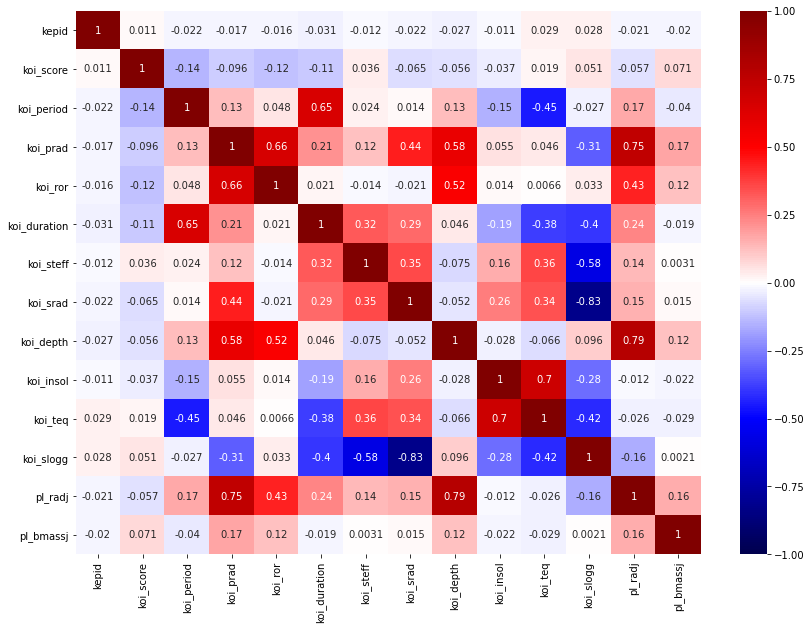

In [17]:
data['koi_ror'] = data['koi_prad']**2/data['koi_srad']**2
data['koi_depth_1'] = data['koi_depth']/1000000
data[['koi_depth_1','koi_ror']] #koi_ror is an approximation of the depth curve from the planetary radius and star's radius
data_cropped = data[['kepid', 'kepler_name', 'koi_pdisposition', 'koi_pdisposition', 'koi_score','koi_period' , 'koi_prad',
                      'koi_ror', 'koi_duration', 'koi_steff', 'koi_srad' , 'koi_depth', 'koi_insol', 'koi_teq', 'koi_slogg']]


#adding in other variables and merging
data_2 = pd.read_csv('planets_2020.12.18_01.53.25.csv')
data_2_edited = data_2[['pl_name', 'pl_discmethod', 'pl_radj','pl_bmassj']]
combined_data = data_cropped.merge(data_2_edited, how='inner', left_on='kepler_name', right_on ='pl_name')
fig, ax = plt.subplots(figsize=(14,10)) 
sns.heatmap(combined_data.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);


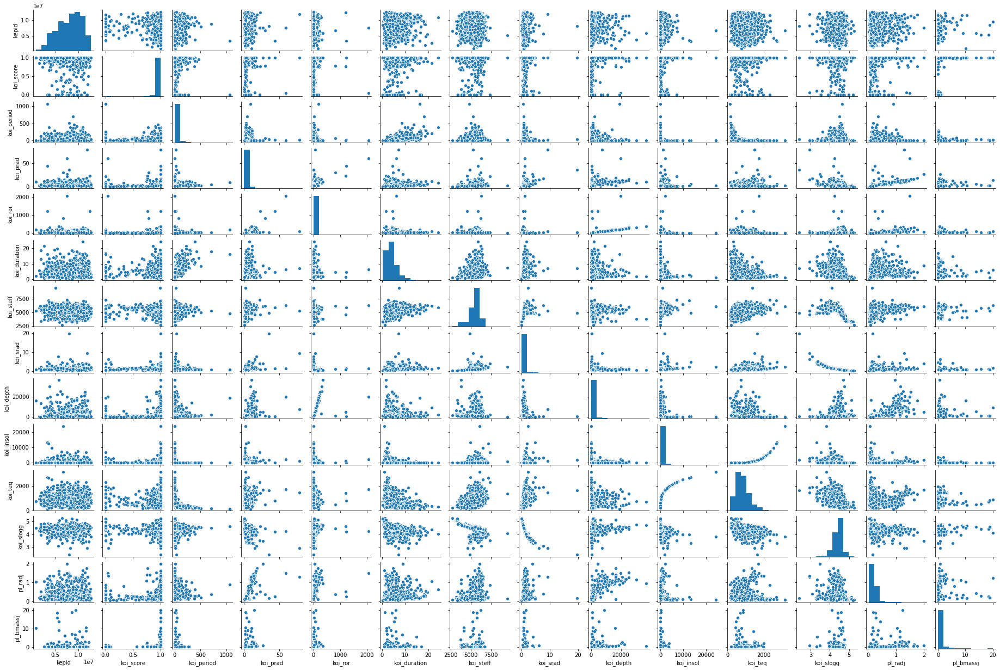

In [18]:
sns.pairplot(combined_data, height=1.2, aspect=1.5);


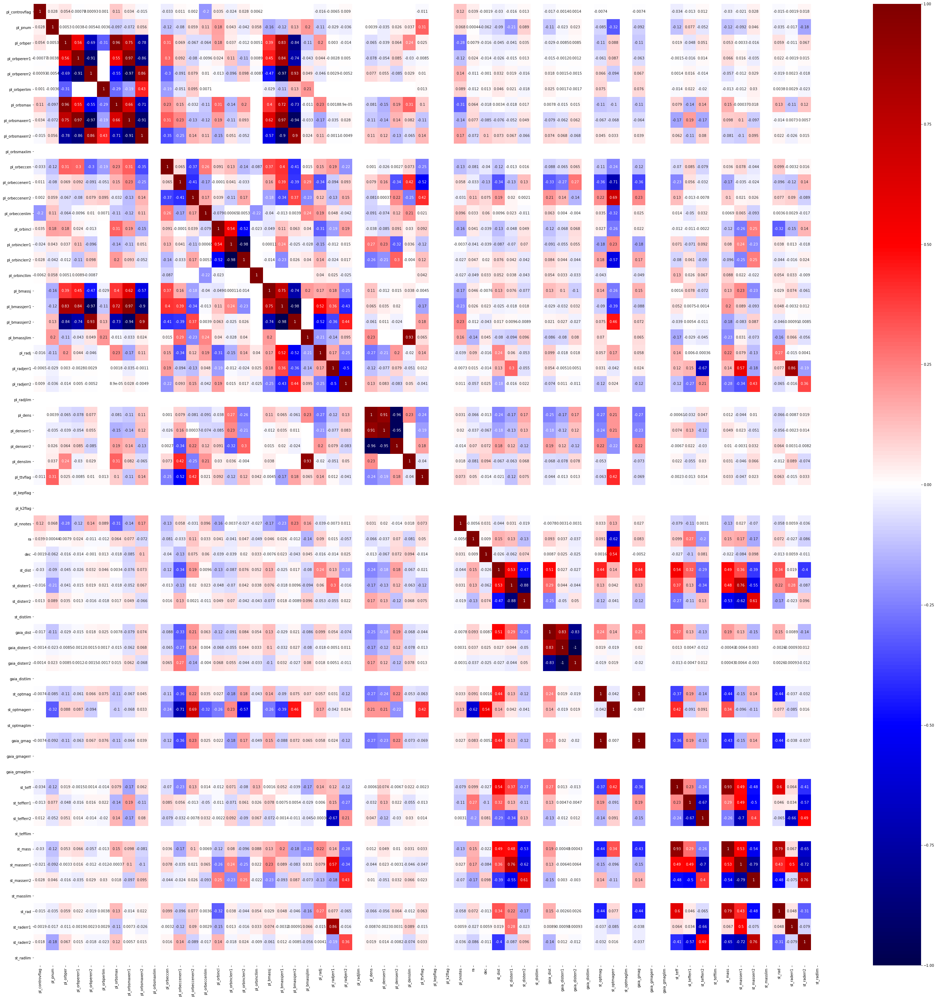

In [19]:
fig, ax = plt.subplots(figsize=(50,50)) 

sns.heatmap(data_2.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

#all the correlations

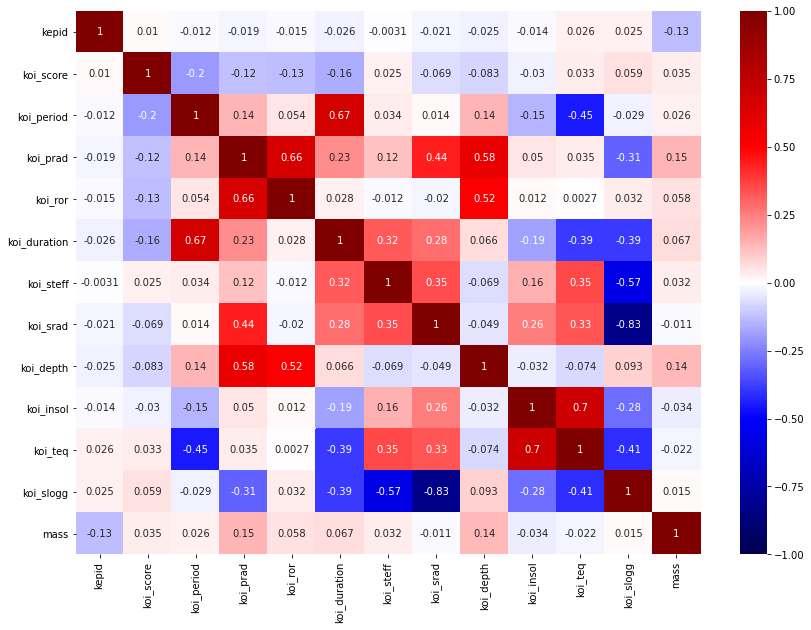

In [23]:
fig, ax = plt.subplots(figsize=(14,10)) 
data_3 = pd.read_csv('exoplanet.eu_catalog (1).csv')
data_3 = data_3.loc[data_3['# name'].str.contains('Kepler')]
data_3_cropped = data_3[['# name', 'mass']]
data_3['mass'].nunique() 
combined_data_3 = data_cropped.merge(data_3_cropped, how='inner', left_on='kepler_name', right_on ='# name')

sns.heatmap(combined_data_3.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

#relevant columns

In [24]:
no_nulls = combined_data_3.dropna(how ='any')
no_nulls['koi_teq'].value_counts()


929.0     2
509.0     2
926.0     2
443.0     2
385.0     2
         ..
576.0     1
520.0     1
930.0     1
423.0     1
1521.0    1
Name: koi_teq, Length: 195, dtype: int64

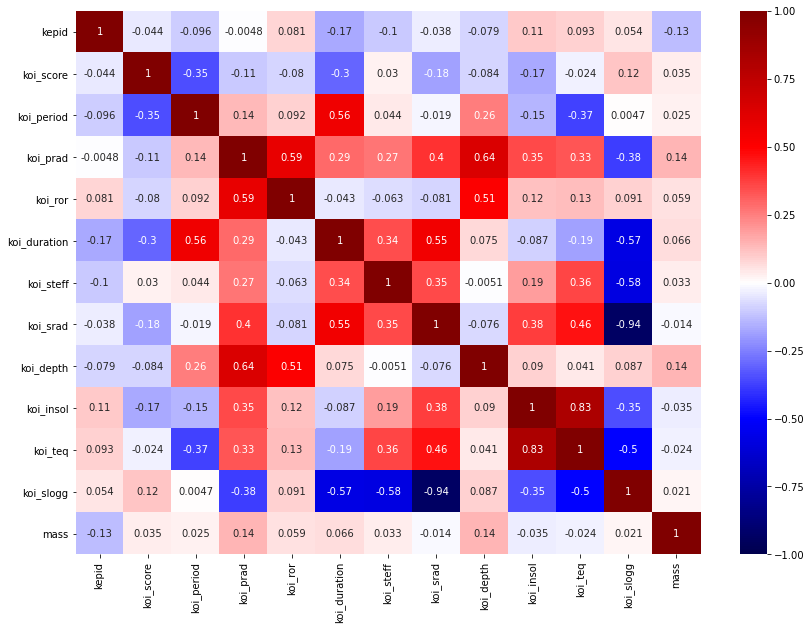

In [25]:
fig, ax = plt.subplots(figsize=(14,10)) 

sns.heatmap(no_nulls.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

#same heat map as above, except that all the nulls have been dropped for this one

### **What we understand from this and further objectives:**
The mass of the planets does not show much of a correlation to any variable. <br />
Find connection between orbital period,and stellar mass- calculate orbit semi major radius<br />
Explain insol (along with teq and srad)<br />

In [26]:
regression = smf.ols('koi_prad ~ koi_duration + koi_srad + koi_depth',combined_data).fit()
print(regression.summary())

                            OLS Regression Results                            
Dep. Variable:               koi_prad   R-squared:                       0.562
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     965.9
Date:                Sat, 19 Dec 2020   Prob (F-statistic):               0.00
Time:                        14:02:44   Log-Likelihood:                -4992.7
No. Observations:                2267   AIC:                             9993.
Df Residuals:                    2263   BIC:                         1.002e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -0.7873      0.106     -7.430   

In [27]:
regression_2 = smf.ols('koi_prad ~ koi_srad + mass', combined_data_3).fit()
print(regression_2.summary())

                            OLS Regression Results                            
Dep. Variable:               koi_prad   R-squared:                       0.184
Model:                            OLS   Adj. R-squared:                  0.177
Method:                 Least Squares   F-statistic:                     24.47
Date:                Sat, 19 Dec 2020   Prob (F-statistic):           2.61e-10
Time:                        14:02:46   Log-Likelihood:                -619.22
No. Observations:                 220   AIC:                             1244.
Df Residuals:                     217   BIC:                             1255.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.5229      0.529      2.880      0.0

In [28]:
regression_3 = smf.ols('koi_prad ~ koi_duration + koi_srad',no_nulls).fit()
print(regression_3.summary())

                            OLS Regression Results                            
Dep. Variable:               koi_prad   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.160
Method:                 Least Squares   F-statistic:                     21.17
Date:                Sat, 19 Dec 2020   Prob (F-statistic):           4.22e-09
Time:                        14:02:48   Log-Likelihood:                -603.71
No. Observations:                 213   AIC:                             1213.
Df Residuals:                     210   BIC:                             1224.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        1.4339      0.583      2.461   

In [29]:
regression_4 = smf.ols('koi_prad ~ koi_srad + mass + koi_depth',no_nulls).fit()
print(regression_4.summary())


                            OLS Regression Results                            
Dep. Variable:               koi_prad   R-squared:                       0.617
Model:                            OLS   Adj. R-squared:                  0.612
Method:                 Least Squares   F-statistic:                     112.4
Date:                Sat, 19 Dec 2020   Prob (F-statistic):           2.26e-43
Time:                        14:02:50   Log-Likelihood:                -520.94
No. Observations:                 213   AIC:                             1050.
Df Residuals:                     209   BIC:                             1063.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.4056      0.394     -1.030      0.3

### **What we understand from this:**

65% of the variation in the the planet's radius can be explained by the duration of the planet's orbit, the star's radius, and the reduction in flux as the planet passes between the telescope's line of sight and the star it revolves around (when all columns are dropped). R^2 when the nulls are not dropped is still 0.56, so it's likely that the rows without nulls are more accurate (planetary radius is calculated using the columns mentioned above, so a high R^2 value is likely)</br>

Mass does not explain much of the variation in planetary radius, or correlate strongly with it.

<div class="alert alert-info alert-info" style="margin-top: 20px">
    
# Predicting - ML Portion

We conduct 4 techniques to build a machine that can learn from our data and predict, when given specifics of an object of interest, whether it's a planet or not. The techniques we use are:
<ol>
<li>Logistic Regression</li>
<li>K Nearest Neighbours </li>
<li>Decision tree</li>
<li>Random Forest</li>
</ol>

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier as rf
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier

In [87]:
X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    target, 
                                                    random_state=1, 
                                                    test_size=.40)

In [39]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error, precision_score, confusion_matrix, accuracy_score
def evaluation(y_true, y_pred):
    
# Print Accuracy, Recall, F1 Score, and Precision metrics.
    print('Evaluation Metrics:')
    print('Accuracy: ' + str(metrics.accuracy_score(y_test, y_pred)))
    print('Recall: ' + str(metrics.recall_score(y_test, y_pred)))
    print('F1 Score: ' + str(metrics.f1_score(y_test, y_pred)))
    print('Precision: ' + str(metrics.precision_score(y_test, y_pred)))

## Logistic regression

In [93]:
from sklearn.preprocessing import MinMaxScaler



model = LogisticRegression(multi_class='auto', solver='lbfgs', max_iter=600)
model.fit(X_train, y_train)
from sklearn.model_selection import GridSearchCV
params_grid = {'C': [670,940,950,960,970,980,990,1000,1200,1300,1350],
              'max_iter': [200,500, 1000, 1500,2000,2300,5000],
               'class_weight':['balanced','uniform'],
               'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
              }
grid = GridSearchCV(model, params_grid, verbose=2)


In [94]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 770 candidates, totalling 3850 fits
[CV] C=670, class_weight=balanced, max_iter=200, solver=newton-cg ....


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:4

[CV]  C=670, class_weight=balanced, max_iter=200, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=newton-cg ....


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s remaining:    0.0s
/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:47

[CV]  C=670, class_weight=balanced, max_iter=200, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=200, solver=newton-cg, total=   1.2s
[CV] C=670, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.9s
[CV] C=670, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=670, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.9s
[CV] C=670, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=670, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=670, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=sag, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=sag, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=sag, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=sag, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=sag, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=saga, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=saga, total=   0.4s
[CV] C=670, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=saga, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=saga, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=200, solver=saga, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=500, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=500, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=500, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.9s
[CV] C=670, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=500, solver=newton-cg, total=   1.2s
[CV] C=670, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=500, solver=lbfgs ........
[CV]  C=670, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=670, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=sag, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=sag, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=sag, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=sag, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=sag, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=saga, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=saga, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=saga, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=saga, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=500, solver=saga, total=   0.8s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.9s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   1.2s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.9s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   1.2s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   1.1s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.9s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   1.2s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   1.0s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=670, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=sag, total=   2.3s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=sag, total=   2.3s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=sag, total=   2.3s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=sag, total=   2.3s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=sag, total=   2.3s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=saga, total=   2.4s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=saga, total=   2.4s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=saga, total=   2.4s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=saga, total=   1.4s
[CV] C=670, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=670, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=670, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=670, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=670, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=670, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=670, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=670, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=670, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=670, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=670, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=670, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/line

[CV]  C=670, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=670, class

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=670, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=500, solver=lbfgs .........
[CV]  C=670, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=670, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=670, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=670, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=670, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=670, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=670, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=670, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=670, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=670, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=670, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=670, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=sag, total=   2.5s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=saga, total=   3.8s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=670, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=670, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=670, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=940, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=940, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=940, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=940, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=9

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=940, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=940, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=940, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=940, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=940, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=940, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=940, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=940, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=940, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=940, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=940, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=940, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=940, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=940, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=940, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=940, cla

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=940, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=940, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=940, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=940, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=940, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=940, clas

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=940, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.7s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=940, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=940, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=940, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=940, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=940, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=940, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=940, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=940, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=sag, total=   2.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=940, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=saga, total=   3.8s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=940, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=940, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=940, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=950, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=950, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=liblinear ....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=950, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=500, solver=lbfgs ........
[CV]  C=950, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=950, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=950, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=950, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=950, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=950, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=950, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=sag, total=   1.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=950, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=950, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=950, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=950, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=950, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=950, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=950, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=balanced, max_iter=5000, solver=saga, total=   4.0s
[CV] C=950, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=950, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentat

[CV]  C=950, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=950, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=950, cla

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=950, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=950, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not c

[CV]  C=950, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=950, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=950, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=950, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=950, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=9

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=950, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.8s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=950, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=950, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=saga, total=   1.3s
[CV] C=950, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=950, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=950, class_weight=uniform, max_iter=2000, solver=sag, total=   1.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=950, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=950, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=950, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=950, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=950, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=950, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=sag, total=   2.4s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=saga, total=   3.8s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=950, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=950, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=950, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=960, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=960, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=960, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=960, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=960, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=500, solver=lbfgs ........
[CV]  C=960, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=500, solver=lbfgs ........
[CV]  C=960, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=960, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=9

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=960, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=960, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=960, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=2300, solver=saga, total=   1.9s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=960, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=960, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=960, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=960, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=200, solver=liblinear .....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=960, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=960, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=500, solver=lbfgs .........
[CV]  C=960, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=500, solver=lbfgs .........
[CV]  C=960, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=960, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=960, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=960, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=960, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=960, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=960, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=960, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=960, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=960, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=960, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=960, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=960, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=960, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=960, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=sag, total=   2.5s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=960, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=960, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=960, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=960, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=970, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=liblinear ....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=970, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=970, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=970, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=sag, total=   1.2s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=970, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=970, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=970, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=970, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=970, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=970, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=970, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=970, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=970, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=970, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=970, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=970, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=970, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=970, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=970, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=9

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=970, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=970, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=970, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=970, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=970, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=970, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=970, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=970, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=970, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=970, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=970, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=sag, total=   2.5s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=saga, total=   3.8s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=970, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=970, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=970, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=980, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=980, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=980, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=980, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=980

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=980, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=980, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=980, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=980, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=sag, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=sag, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=980, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=980, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=980, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=980, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=980, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=5000, solver=sag, total=   3.8s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=980, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=980, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=980, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=980, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=980, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=200, solver=liblinear .....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=980, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=980, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=500, solver=lbfgs .........
[CV]  C=980, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=980, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=980, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=980, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=980, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=980, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=980, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   1.0s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=980, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=980, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=sag, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=sag, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=sag, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=saga, total=   1.7s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=980, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=980, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=980, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=980, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=980, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=980, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=sag, total=   2.4s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=980, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=980, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=980, class_weight=uniform, max_iter=5000, solver=saga, total=   4.0s
[CV] C=990, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=990, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=990, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=lbfgs ........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=200, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=9

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=sag ..........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=200, solver=saga .........
[CV]  C=990, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=500, solver=liblinear ....
[CV]  C=990, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=balanced, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.8s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=990, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=sag, total=   1.2s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=balanced, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=990, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=balanced, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=990, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=balanced, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=990, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=lbfgs .......
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=liblinear ...
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=990, c

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=saga ........
[CV]  C=990, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=990, class_weight=balanced, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=990, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=200, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=uniform, max_iter=200, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=990, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=uniform, max_iter=200, solver=lbfgs .........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=990, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=200, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=990, class_weigh

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=990, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=sag ...........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=200, solver=saga ..........
[CV]  C=990, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not c

[CV]  C=990, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=500, solver=newton-cg .....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=500, solver=lbfgs .........
[CV]  C=990, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=500, solver=lbfgs .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=990, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=500, solver=liblinear .....
[CV]  C=990, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=sag ...........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=500, solver=saga ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=990, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=990, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=uniform, max_iter=1000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=990, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=990, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=sag, total=   1.2s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=uniform, max_iter=1500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=990, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=990, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=uniform, max_iter=2000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=990, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=990, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=sag, total=   1.8s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=uniform, max_iter=2300, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=990, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=990, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=lbfgs ........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=liblinear ....
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=990, class_we

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=990, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=sag, total=   2.4s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=sag ..........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=5000, solver=sag, total=   3.8s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=saga .........
[CV]  C=990, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=990, class_weight=uniform, max_iter=5000, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=990, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1000, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1000, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1000, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1000, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1000, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=sag, total=   1.8s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.7s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=liblinear ..
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1000, class_weight=balanced, max_iter=5000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1000, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1000, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1000, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=100

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1000, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1000, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1000, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=saga, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=saga, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=saga, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=saga, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1000, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1000, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1000, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=saga, total=   1.9s
[CV] C=1000, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1000, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=sag, total=   2.5s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=saga, total=   3.8s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1000, class_weight=uniform, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1000, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1200, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1200, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1200, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=lbfgs .......
[CV]  C=1200, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1200, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=liblinear ..
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1200, class_weight=balanced, max_iter=5000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentat

[CV]  C=1200, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1200, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=liblinear ....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1200, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1200, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1200, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1200, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1200, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1200, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1200, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=2300, solver=saga, total=   1.9s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.6s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1200, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=sag, total=   2.5s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1200, class_weight=uniform, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1200, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1300, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1300, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=liblinear ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1300, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1300, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=saga, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=liblinear ..
[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=liblinear ..
[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=liblinear ..
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1300, class_weight=balanced, max_iter=5000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1300, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1300, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1300, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=130

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1300, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1300, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1300, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1300, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1300, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1300, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1300, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1300, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:204: UserWarning:

Line Search failed



[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.1s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.5s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1300, 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=sag, total=   2.4s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=sag, total=   2.8s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=saga, total=   3.8s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1300, class_weight=uniform, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1300, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterat

[CV]  C=1350, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=lbfgs .......
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=liblinear, total=   0.1s
[

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=sag .........
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=200, solver=saga ........
[CV]  C=1350, class_weight=balanced, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=500, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=lbfgs .......
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=lbfgs .......
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=liblinear ...
[CV]  C=1350, class_weight=balanced, max_iter=500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=balanced, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=liblinear, total=   0.1s
[C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=liblinear, total=   0.1s
[C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=balanced, max_iter=1500, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=balanced, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=liblinear, total=   0.1s
[C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=balanced, max_iter=2000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=liblinear, total=   0.1s
[C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=sag, total=   1.8s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=sag ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=balanced, max_iter=2300, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=balanced, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg ..


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=newton-cg, total=   0.6s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs ......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs ......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=liblinear ..
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=liblinear, total=   0.1s
[C

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=saga, total=   3.8s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=saga .......
[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1350, class_weight=balanced, max_iter=5000, solver=saga .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=balanced, max_iter=5000, solver=saga, total=   3.9s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=newton-cg, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages

[CV]  C=1350, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=lbfgs ........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=lbfgs, total=   0.1s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=liblinear ....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, 

[CV]  C=1350, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=sag ..........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=sag, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=saga .........
[CV]  C=1350, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=200, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=200, solver=saga, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=newton-cg ....


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=500, solver=newton-cg, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1350, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=lbfgs ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=lbfgs ........
[CV]  C=1350, class_weight=uniform, max_iter=500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=liblinear ....


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1350, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=liblinear ....
[CV]  C=1350, class_weight=uniform, max_iter=500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=sag ..........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=sag, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=500, solver=saga .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=500, solver=saga, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=newton-cg, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=liblinear ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=sag, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=sag, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1000, solver=saga, total=   0.8s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=newton-cg, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=liblinear ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=sag, total=   1.1s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=uniform, max_iter=1500, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=1500, solver=saga, total=   1.2s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=newton-cg, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=liblinear ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=sag, total=   1.5s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=uniform, max_iter=2000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2000, solver=saga, total=   1.6s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:437: LineSearchWarning:

Rounding errors prevent the line search from converging



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=newton-cg, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=liblinear ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=sag .........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=sag, total=   1.7s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=uniform, max_iter=2300, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=2300, solver=saga, total=   1.8s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.5s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg ...


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=newton-cg, total=   0.7s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs .......


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.4s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.3s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs .......
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=lbfgs, total=   0.2s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=liblinear ...


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py", line 1356, in fit
    self.coef_, self.intercept_, n_iter_ = _fit_liblinear(
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py", line 930, in _fit_liblinear
    class_weight_ = compute_class_weight(class_weight, classes=classes_,
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/class_weight.py", line 63, in compute_class_weigh

[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=liblinear ...
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=liblinear, total=   0.0s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=sag, total=   2.7s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=sag .........
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=sag, total=   2.9s
[CV] 

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=sag, total=   3.7s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=saga, total=   3.6s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=saga, total=   3.5s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=saga ........
[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=saga, total=   3.7s
[CV] C=1350, class_weight=uniform, max_iter=5000, solver=saga ........


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:329: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

[Parallel(n_jobs=1)]: Done 3850 out of 3850 | elapsed: 45.3min finished


[CV]  C=1350, class_weight=uniform, max_iter=5000, solver=saga, total=   3.9s


/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/linesearch.py:477: LineSearchWarning:

The line search algorithm did not converge

/opt/anaconda

GridSearchCV(estimator=LogisticRegression(max_iter=600),
             param_grid={'C': [670, 940, 950, 960, 970, 980, 990, 1000, 1200,
                               1300, 1350],
                         'class_weight': ['balanced', 'uniform'],
                         'max_iter': [200, 500, 1000, 1500, 2000, 2300, 5000],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             verbose=2)

In [95]:
print(grid.best_params_)
print(grid.best_score_)

{'C': 950, 'class_weight': 'uniform', 'max_iter': 200, 'solver': 'newton-cg'}
0.7982099996355438


In [100]:
lr = LogisticRegression(multi_class='auto', C=670, max_iter=500,solver='lbfgs',class_weight='uniform')

# Fitting Model to the train set
lr.fit(X_train, y_train)

# Predicting on the test set
y_pred = lr.predict(X_test)

# Evaluating model
evaluation(y_test, y_pred)

Evaluation Metrics:
Accuracy: 0.7747344885410844
Recall: 0.8457971014492753
F1 Score: 0.7835660580021482
Precision: 0.7298649324662331


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



## KNearest Neighbours

In [102]:
from sklearn.neighbors import KNeighborsClassifier as knn
from sklearn.model_selection import cross_val_score
knn_scores = pd.Series(dtype='float64')
for i in range(1,50,1):
    knn_scores.loc[i] = cross_val_score(knn(n_neighbors=i),X_train, y_train,cv=5).mean()
    print("for K=", i,":", knn_scores.loc[i])

for K= 1 : 0.6957375985116305
for K= 2 : 0.6799026728520083
for K= 3 : 0.7259196009725772
for K= 4 : 0.7156735236488656
for K= 5 : 0.7378425237026662
for K= 6 : 0.7324402422071465
for K= 7 : 0.7413843433107544
for K= 8 : 0.742691352496785
for K= 9 : 0.7471611468914494
for K= 10 : 0.7454841279345229
for K= 11 : 0.74809033653187
for K= 12 : 0.7508871036322395
for K= 13 : 0.7492080020687226
for K= 14 : 0.7492078285181732
for K= 15 : 0.7514448950973704
for K= 16 : 0.7529348265622586
for K= 17 : 0.7521908153578352
for K= 18 : 0.7533093486474337
for K= 19 : 0.7521913360094828
for K= 20 : 0.7531238231103382
for K= 21 : 0.7507003632412994
for K= 22 : 0.7514447215468213
for K= 23 : 0.7520052898207397
for K= 24 : 0.7521909889083844
for K= 25 : 0.7510728027198843
for K= 26 : 0.7531222611553954
for K= 27 : 0.7507000161402011
for K= 28 : 0.7546118455191851
for K= 29 : 0.75237651444548
for K= 30 : 0.7551715460403574
for K= 31 : 0.753866445910368
for K= 32 : 0.7547977181573791
for K= 33 : 0.754798585

In [103]:
print("Maximum model score occurs at K=", knn_scores.idxmax(),"with",knn_scores[knn_scores.idxmax()])

Maximum model score occurs at K= 30 with 0.7551715460403574


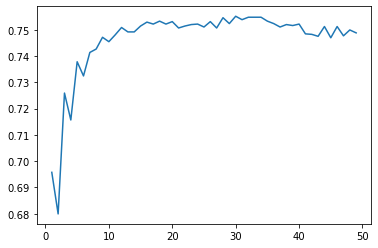

In [104]:
knn_scores.plot()

In [105]:
knn = KNeighborsClassifier(n_neighbors=30)

# Fitting Model to the train set
knn.fit(X_train, y_train)

# Predicting on the test set
y_pred = knn.predict(X_test)

# Evaluating model
evaluation(y_test, y_pred)

Evaluation Metrics:
Accuracy: 0.767188373392957
Recall: 0.8092753623188406
F1 Score: 0.7702068965517241
Precision: 0.7347368421052631


## Decision Tree

In [106]:
tree = DecisionTreeClassifier(max_depth = 336,max_features=9)

# Fitting Model to the train set
tree.fit(X_train, y_train)

# Predicting on the test set
y_pred = tree.predict(X_test)

# Evaluating model
evaluation(y_test, y_pred)

Evaluation Metrics:
Accuracy: 0.7705422023476802
Recall: 0.7663768115942029
F1 Score: 0.7630591630591631
Precision: 0.7597701149425288


## Random Forest

In [107]:


#max_depth hyperparameter tuning
rf_scores = pd.Series(dtype='float64')
for i in range(1,500,5):
    rf_scores.loc[i] = cross_val_score(rf(max_depth=i),X_train, y_train,cv=5).mean()
    print("for max_depth =", i,":", rf_scores.loc[i])

for max_depth = 1 : 0.7663518459704166
for max_depth = 6 : 0.8097608299881465
for max_depth = 11 : 0.8306304570800815
for max_depth = 16 : 0.8410634483452825
for max_depth = 21 : 0.8401337380532141
for max_depth = 26 : 0.8416229753159052
for max_depth = 31 : 0.8401325231993697
for max_depth = 36 : 0.8399464770106265
for max_depth = 41 : 0.8438600418951026
for max_depth = 46 : 0.8416240166192006
for max_depth = 51 : 0.8412503622867715
for max_depth = 56 : 0.8418104099090421
for max_depth = 61 : 0.8386438065883259
for max_depth = 66 : 0.8421831964887252
for max_depth = 71 : 0.8378952830696234
for max_depth = 76 : 0.8393876442422001
for max_depth = 81 : 0.8449768396792091
for max_depth = 86 : 0.8390136428086727
for max_depth = 91 : 0.8423678542730748
for max_depth = 96 : 0.8433012091266763
for max_depth = 101 : 0.8377106252852737
for max_depth = 106 : 0.8427411615044056
for max_depth = 111 : 0.8416238430686513
for max_depth = 116 : 0.8414365820260639
for max_depth = 121 : 0.84181023635849

In [108]:
print("Maximum model score occurs at max_depth =", rf_scores.idxmax(),"with",rf_scores[rf_scores.idxmax()])

Maximum model score occurs at max_depth = 416 with 0.8457241483440674


In [114]:
forest = RandomForestClassifier(n_estimators=200,max_depth = 416,max_features=9)
# Fitting Model to the train set
forest.fit(X_train, y_train)
# Predicting on the test set
y_pred = forest.predict(X_test)

# Evaluating model
evaluation(y_test, y_pred)

Evaluation Metrics:
Accuracy: 0.8468418110676356
Recall: 0.8365217391304348
F1 Score: 0.8404193360512522
Precision: 0.8443534230544177


In [110]:
rf1_scores = pd.Series(dtype='float64')
for i in range(1,17):
    rf1_scores.loc[i] = cross_val_score(rf(max_features=i),X_train, y_train,cv=5).mean()
    print("for max_features =", i,":", rf1_scores.loc[i])

for max_features = 1 : 0.831004458513609
for max_features = 2 : 0.8390145105614186
for max_features = 3 : 0.8380842796177028
for max_features = 4 : 0.8386427652850308
for max_features = 5 : 0.8423688955763702
for max_features = 6 : 0.8425549417651131
for max_features = 7 : 0.8418104099090421
for max_features = 8 : 0.8399457828084296
for max_features = 9 : 0.8421830229381762
for max_features = 10 : 0.8378966714740169
for max_features = 11 : 0.8401349529070584
for max_features = 12 : 0.8419950676933917
for max_features = 13 : 0.841996108996687
for max_features = 14 : 0.84274237635825
for max_features = 15 : 0.8434872553154195
for max_features = 16 : 0.8433001678233811


In [111]:
rf1_scores.idxmax()

15

In [113]:
forest = RandomForestClassifier(n_estimators=100, max_features=15,max_depth = 416,criterion='gini')
# Fitting Model to the train set
forest.fit(X_train, y_train)
# Predicting on the test set
y_pred = forest.predict(X_test)

# Evaluating model
evaluation(y_test, y_pred)

Evaluation Metrics:
Accuracy: 0.8460033538289548
Recall: 0.8336231884057971
F1 Score: 0.8392179749051648
Precision: 0.8448883666274971


Out of all the techniques used, after hyperparameter tuning, the best technique is random forest with a classification accuracy on the testing data of 84.6%

<div class="alert alert-info alert-info" style="margin-top: 20px">
    
# Give us the specifics of your object of interest, let's see if it could be an exoplanet:

## Building the Predictor:

From regressions and ML, we narrowed down the following features for an interactive program to predict whether an object is an exoplanet:
<ol>
<li>Radius</li>
<li>Effective Temperature </li>
<li>Orbital Period</li>
<li>Mass</li>
</ol>
The Prediction method we will use is a Random forest classifier because from the previous section it is quite clear that this technique is superior to the rest used. 
    


In [31]:
f=db.drop(columns=['rowid', 'kepid', 'kepoi_name', 'kepler_name', 'koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss',
       'koi_fpflag_co', 'koi_fpflag_ec','koi_score', 'koi_fpflag_nt', 'koi_fpflag_ss','koi_fpflag_co', 'koi_fpflag_ec','koi_period_err1',
       'koi_period_err2', 'koi_time0bk_err1',
       'koi_time0bk_err2', 'koi_impact_err1', 'koi_impact_err2',
       'koi_duration_err1', 'koi_duration_err2', 
       'koi_depth_err1', 'koi_depth_err2', 'koi_prad_err1',
       'koi_prad_err2','koi_teq_err1', 'koi_teq_err2', 
       'koi_insol_err1', 'koi_insol_err2', 
        'koi_steff_err1', 'koi_steff_err2',
       'koi_slogg_err1', 'koi_slogg_err2',
       'koi_srad_err1', 'koi_srad_err2', 'koi_tce_delivname','koi_time0bk','koi_impact','koi_duration','koi_depth',
               'koi_insol','koi_model_snr','koi_tce_plnt_num','koi_teq','koi_slogg','koi_srad','ra','dec','koi_kepmag'])
f

,koi_disposition,koi_pdisposition,koi_period,koi_prad,koi_steff
0,CONFIRMED,CANDIDATE,9.488036,2.26,5455.0
1,CONFIRMED,CANDIDATE,54.418383,2.83,5455.0
2,FALSE POSITIVE,FALSE POSITIVE,19.899140,14.60,5853.0
3,FALSE POSITIVE,FALSE POSITIVE,1.736952,33.46,5805.0
4,CONFIRMED,CANDIDATE,2.525592,2.75,6031.0
...,...,...,...,...,...
9559,FALSE POSITIVE,FALSE POSITIVE,8.589871,1.11,5638.0
9560,FALSE POSITIVE,FALSE POSITIVE,0.527699,29.35,5638.0
9561,CANDIDATE,CANDIDATE,1.739849,0.72,6119.0
9562,FALSE POSITIVE,FALSE POSITIVE,0.681402,1.07,6173.0


In [32]:
f['koi_disposition'].value_counts()

FALSE POSITIVE    5023
CONFIRMED         2293
CANDIDATE         2248
Name: koi_disposition, dtype: int64

In [33]:

f['exo_candidate'] = f['koi_pdisposition'].apply(lambda x: 1 if x == 'CANDIDATE' else 0)
f['exo_confirmed'] = f['koi_disposition'].apply(lambda x: 2 if x == 'CONFIRMED' else 1 if x == 'CANDIDATE' else 0 )
f=f.drop(columns=['koi_disposition','koi_pdisposition'])
f

,koi_period,koi_prad,koi_steff,exo_candidate,exo_confirmed
0,9.488036,2.26,5455.0,1,2
1,54.418383,2.83,5455.0,1,2
2,19.899140,14.60,5853.0,0,0
3,1.736952,33.46,5805.0,0,0
4,2.525592,2.75,6031.0,1,2
...,...,...,...,...,...
9559,8.589871,1.11,5638.0,0,0
9560,0.527699,29.35,5638.0,0,0
9561,1.739849,0.72,6119.0,1,1
9562,0.681402,1.07,6173.0,0,0


In [34]:
features = f.drop(columns=['exo_candidate','exo_confirmed'])
features = features[~features.isin([np.nan, np.inf, -np.inf]).any(1)]
features

,koi_period,koi_prad,koi_steff
0,9.488036,2.26,5455.0
1,54.418383,2.83,5455.0
2,19.899140,14.60,5853.0
3,1.736952,33.46,5805.0
4,2.525592,2.75,6031.0
...,...,...,...
9559,8.589871,1.11,5638.0
9560,0.527699,29.35,5638.0
9561,1.739849,0.72,6119.0
9562,0.681402,1.07,6173.0


In [35]:
target = f[~f.isin([np.nan, np.inf, -np.inf]).any(1)]['exo_candidate']
target

0       1
1       1
2       0
3       0
4       1
       ..
9559    0
9560    0
9561    1
9562    0
9563    0
Name: exo_candidate, Length: 9201, dtype: int64

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, 
                                                    target, 
                                                    random_state=1, 
                                                    test_size=0.33,
                                                   stratify=target)

In [37]:
y_train.value_counts()

0    3194
1    2970
Name: exo_candidate, dtype: int64

In [536]:
#max_depth hyperparameter tuning
from sklearn.model_selection import cross_val_score
rf_scores = pd.Series(dtype='float64')
for i in range(1,1000,10):
    rf_scores.loc[i] = cross_val_score(RandomForestClassifier(max_depth=i),X_train, y_train).mean()
    print("for max_depth =", i,":", rf_scores.loc[i])

for max_depth = 1 : 0.756977359623345
for max_depth = 11 : 0.7952642957205001
for max_depth = 21 : 0.786666719330953
for max_depth = 31 : 0.785207655280648
for max_depth = 41 : 0.7834229942806584
for max_depth = 51 : 0.7824476516994766
for max_depth = 61 : 0.7795300502417291
for max_depth = 71 : 0.7830977923131208
for max_depth = 81 : 0.7816383332806691
for max_depth = 91 : 0.7824492316280638
for max_depth = 101 : 0.7848824533131102
for max_depth = 111 : 0.7829354546507832
for max_depth = 121 : 0.7837464846588935
for max_depth = 131 : 0.7826114376296858
for max_depth = 141 : 0.7824485733244857
for max_depth = 151 : 0.7819634035874912
for max_depth = 161 : 0.7852067336556388
for max_depth = 171 : 0.784557777988435
for max_depth = 181 : 0.783260261636174
for max_depth = 191 : 0.7832606566183208
for max_depth = 201 : 0.7839093489640935
for max_depth = 211 : 0.7835848053001337
for max_depth = 221 : 0.7834225992985117
for max_depth = 231 : 0.7829357179722143
for max_depth = 241 : 0.78228663

In [540]:
rf_scores.idxmax()

11

In [538]:
rf1_scores = pd.Series(dtype='float64')
for i in range(1,4):
    rf1_scores.loc[i] = cross_val_score(RandomForestClassifier(max_features=i),X_train, y_train,cv=5).mean()
    print("for max_features =", i,":", rf1_scores.loc[i])

for max_features = 1 : 0.7832611832611833
for max_features = 2 : 0.7798528823163859
for max_features = 3 : 0.7779062786362057


In [539]:
rf1_scores = pd.Series(dtype='float64')
for i in range(1,800,20):
    rf1_scores.loc[i] = cross_val_score(RandomForestClassifier(n_estimators=i),X_train, y_train,cv=5).mean()
    print("for n_estimators =", i,":", rf1_scores.loc[i])

for n_estimators = 1 : 0.7131764727567648
for n_estimators = 21 : 0.7782306906394497
for n_estimators = 41 : 0.7796905446540483
for n_estimators = 61 : 0.7817996176572819
for n_estimators = 81 : 0.7850449226361635
for n_estimators = 101 : 0.7816376749770909
for n_estimators = 121 : 0.7839096122855247
for n_estimators = 141 : 0.7821248196248196
for n_estimators = 161 : 0.7843954403260972
for n_estimators = 181 : 0.7816379382985222
for n_estimators = 201 : 0.7852063386734921
for n_estimators = 221 : 0.783260919939752
for n_estimators = 241 : 0.78536986128227
for n_estimators = 261 : 0.782449494949495
for n_estimators = 281 : 0.7796908079754795
for n_estimators = 301 : 0.7843955719868129
for n_estimators = 321 : 0.7835846736394181
for n_estimators = 341 : 0.7835849369608494
for n_estimators = 361 : 0.7861801013260867
for n_estimators = 381 : 0.783584410317987
for n_estimators = 401 : 0.7848827166345415
for n_estimators = 421 : 0.7853699929429856
for n_estimators = 441 : 0.7826114376296858

In [542]:
rf1_scores.idxmax()

601

In [40]:
forest = RandomForestClassifier(n_estimators=601, max_features=1,max_depth = 11)
# Fitting Model to the train set
forest.fit(X_train, y_train)
# Predicting on the test set
y_pred = forest.predict(X_test)

# Evaluating model
evaluation(y_test, y_pred)

Evaluation Metrics:
Accuracy: 0.8027658873888706
Recall: 0.8318523581681476
F1 Score: 0.8025057698648204
Precision: 0.7751592356687899


## The Predictor:

In [71]:
from IPython.display import Markdown, display
import emoji
def printmd(string):
    display(Markdown(string))

In [44]:
from ipywidgets import widgets  

printmd("**Fill up the specifics:**")
printmd("PS. Press the Enter key after entering each detail and everytime you want to change numbers, rerun this cell!!")
printmd("For results, run the next cell")
user=[]
style = {'description_width': 'initial'}
# Create text widget for input
input_text3 = widgets.Text(description='Orbital Period:', style=style)
input_text1 = widgets.Text(description='Radius (Relative to Earth):', style=style)
input_text2 = widgets.Text(description='Effective Temperature (in Kelvin):', style=style)



# Define function to bind value of the input to the output variable 
def fun1(sender):
    user.append(input_text1.value)
def fun2(sender):   
    user.append(input_text2.value)
def fun3(sender):
    user.append(input_text3.value)

# Tell the text input widget to call bind_input_to_output() on submit
input_text1.on_submit(fun1)
input_text2.on_submit(fun2)
input_text3.on_submit(fun3)




# Display input text box widget for input
# Display input text box widget for input
display(input_text3)
display(input_text1)
display(input_text2)


#koi_prad,koi_steff,koi_period,mass

**Fill up the specifics:**

PS. Press the Enter key after entering each detail and everytime you want to change numbers, rerun this cell!!

For results, run the next cell

Text(value='', description='Orbital Period:', style=DescriptionStyle(description_width='initial'))

Text(value='', description='Radius (Relative to Earth):', style=DescriptionStyle(description_width='initial'))

Text(value='', description='Effective Temperature (in Kelvin):', style=DescriptionStyle(description_width='ini…

In [45]:
x=[user]
if forest.predict(x)==0:
    print("Nope, this is likely not an exoplanet!")
else:
    print("YAY, this could be an exoplanet!")
    


Nope, this is likely not an exoplanet!


In [105]:
#### from ipywidgets import widgets  

printmd("**Fill up the specifics:**")
printmd("PS. Press the Enter key after entering each detail and everytime you want to change numbers, rerun this cell!!")
printmd("For results, run the next cell")
user=[]
style = {'description_width': 'initial'}
# Create text widget for input
input_text3 = widgets.Text(description='Orbital Period:', style=style)
input_text1 = widgets.Text(description='Radius (Relative to Earth):', style=style)
input_text2 = widgets.Text(description='Effective Temperature (in Kelvin):', style=style)



# Define function to bind value of the input to the output variable 
def fun1(sender):
    user.append(input_text1.value)
def fun2(sender):   
    user.append(input_text2.value)
def fun3(sender):
    user.append(input_text3.value)

# Tell the text input widget to call bind_input_to_output() on submit
input_text1.on_submit(fun1)
input_text2.on_submit(fun2)
input_text3.on_submit(fun3)




# Display input text box widget for input
# Display input text box widget for input
display(input_text3)
display(input_text1)
display(input_text2)


#koi_prad,koi_steff,koi_period,mass

**Fill up the specifics:**

PS. Press the Enter key after entering each detail and everytime you want to change numbers, rerun this cell!!

For results, run the next cell

Text(value='', description='Orbital Period:', style=DescriptionStyle(description_width='initial'))

Text(value='', description='Radius (Relative to Earth):', style=DescriptionStyle(description_width='initial'))

Text(value='', description='Effective Temperature (in Kelvin):', style=DescriptionStyle(description_width='ini…

In [106]:
x=[user]
if forest.predict(x)==0:
    print("Nope, this is likely not an exoplanet!")
else:
    print("YAY, this could be an exoplanet!")
    


YAY, this could be an exoplanet!


 <div class="alert alert-info alert-info" style="margin-top: 20px">
    
# Habitability of exoplanets - Can we leave earth for another home?

Now, we test some conditions, and narrow down our list of exoplanets to get a list of potential destinations for us to visit.

In [91]:
data = db
data

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,3,10811496,K00753.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,9560,10031643,K07984.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,0,...,-152.0,4.296,0.231,-0.189,1.088,0.313,-0.228,298.74921,46.973351,14.478
9560,9561,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,...,-166.0,4.529,0.035,-0.196,0.903,0.237,-0.079,297.18875,47.093819,14.082
9561,9562,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,0.497,0,0,0,...,-220.0,4.444,0.056,-0.224,1.031,0.341,-0.114,286.50937,47.163219,14.757
9562,9563,10147276,K07987.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.021,0,0,1,...,-236.0,4.447,0.056,-0.224,1.041,0.341,-0.114,294.16489,47.176281,15.385


In [92]:
data.set_index('rowid')

,kepid,kepoi_name,kepler_name,koi_disposition,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,...,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_srad,koi_srad_err1,koi_srad_err2,ra,dec,koi_kepmag
rowid,,,,,,,,,,,,,,,,,,,,,
1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,0,...,-81.0,4.467,0.064,-0.096,0.927,0.105,-0.061,291.93423,48.141651,15.347
3,10811496,K00753.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-176.0,4.544,0.044,-0.176,0.868,0.233,-0.078,297.00482,48.134129,15.436
4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,...,-174.0,4.564,0.053,-0.168,0.791,0.201,-0.067,285.53461,48.285210,15.597
5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,...,-211.0,4.438,0.070,-0.210,1.046,0.334,-0.133,288.75488,48.226200,15.509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9560,10031643,K07984.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,0,0,1,...,-152.0,4.296,0.231,-0.189,1.088,0.313,-0.228,298.74921,46.973351,14.478
9561,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,0,...,-166.0,4.529,0.035,-0.196,0.903,0.237,-0.079,297.18875,47.093819,14.082
9562,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,0.497,0,0,0,0,...,-220.0,4.444,0.056,-0.224,1.031,0.341,-0.114,286.50937,47.163219,14.757


In [93]:
#merging the new dataset to add column of mass
data_3 = pd.read_csv('exoplanet.eu_catalog (1).csv')
data_3 = data_3.loc[data_3['# name'].str.contains('Kepler')]
data_3

,# name,planet_status,mass,mass_error_min,mass_error_max,mass_sini,mass_sini_error_min,mass_sini_error_max,radius,radius_error_min,...,star_sp_type,star_age,star_age_error_min,star_age_error_max,star_teff,star_teff_error_min,star_teff_error_max,star_detected_disc,star_magnetic_field,star_alternate_names
9,Kepler-10 b,Confirmed,0.01048,0.00154,0.00154,NaN,NaN,NaN,0.1311,0.0018,...,G,10.6,1.50,1.50,5708.0,28.00,28.00,NaN,NaN,NaN
10,Kepler-10 c,Confirmed,0.05410,0.00600,0.00600,NaN,NaN,NaN,0.2097,0.0036,...,G,10.6,1.50,1.50,5708.0,28.00,28.00,NaN,NaN,NaN
11,Kepler-100 b,Confirmed,NaN,NaN,NaN,0.0231,0.0100,0.010,0.1164,0.0027,...,NaN,6.5,0.56,0.46,5825.0,75.00,75.00,NaN,NaN,KOI-41
12,Kepler-100 c,Confirmed,NaN,NaN,NaN,0.0027,0.0130,0.013,0.1981,0.0020,...,NaN,6.5,0.56,0.46,5825.0,75.00,75.00,NaN,NaN,KOI-41
13,Kepler-100 d,Confirmed,NaN,NaN,NaN,0.0094,0.0094,0.000,0.1351,0.0030,...,NaN,6.5,0.56,0.46,5825.0,75.00,75.00,NaN,NaN,KOI-41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2362,Kepler-995 b,Confirmed,NaN,NaN,NaN,NaN,NaN,NaN,0.2410,0.0150,...,NaN,NaN,NaN,NaN,5206.0,74.71,110.94,NaN,NaN,NaN
2363,Kepler-996 b,Confirmed,NaN,NaN,NaN,NaN,NaN,NaN,0.1770,0.0220,...,NaN,NaN,NaN,NaN,6014.0,152.18,114.40,NaN,NaN,NaN
2364,Kepler-997 b,Confirmed,NaN,NaN,NaN,NaN,NaN,NaN,0.1210,0.0230,...,NaN,NaN,NaN,NaN,6150.0,54.96,62.57,NaN,NaN,NaN
2365,Kepler-998 b,Confirmed,NaN,NaN,NaN,NaN,NaN,NaN,0.2070,0.0270,...,NaN,NaN,NaN,NaN,6058.0,165.40,104.50,NaN,NaN,NaN


In [94]:
#merging to get columns of star_metallicity,planet-star_separation_radius
orbital_rad = pd.read_csv('cumulative_2020.12.18_04.44.49.csv')
orbital_rad.rename(columns={"koi_smet": "star_metallicity", "koi_sma": "planet-star_separation_radius"})
orbital_rad

,kepid,kepoi_name,kepler_name,koi_eccen,koi_eccen_err1,koi_eccen_err2,koi_impact,koi_impact_err1,koi_impact_err2,koi_sma,...,koi_limbdark_mod,koi_ldm_coeff4,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_parm_prov,koi_model_snr,koi_smet,koi_smet_err1,koi_smet_err2
0,10797460,K00752.01,Kepler-227 b,0.0,NaN,NaN,0.146,0.318,-0.146,0.0853,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2291,0.4603,q1_q17_dr25_koi,35.8,0.14,0.15,-0.15
1,10797460,K00752.02,Kepler-227 c,0.0,NaN,NaN,0.586,0.059,-0.443,0.2734,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2291,0.4603,q1_q17_dr25_koi,25.8,0.14,0.15,-0.15
2,10811496,K00753.01,NaN,0.0,NaN,NaN,0.969,5.126,-0.077,0.1419,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2711,0.3858,q1_q17_dr25_koi,76.3,-0.18,0.30,-0.30
3,10848459,K00754.01,NaN,0.0,NaN,NaN,1.276,0.115,-0.092,0.0267,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2865,0.3556,q1_q17_dr25_koi,505.6,-0.52,0.30,-0.30
4,10854555,K00755.01,Kepler-664 b,0.0,NaN,NaN,0.701,0.235,-0.478,0.0374,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2844,0.3661,q1_q17_dr25_koi,40.9,0.07,0.25,-0.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,10090151,K07985.01,NaN,0.0,NaN,NaN,1.252,0.051,-0.049,0.0128,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2602,0.4096,q1_q17_dr25_koi,453.3,0.14,0.20,-0.30
9560,10128825,K07986.01,NaN,0.0,NaN,NaN,0.043,0.423,-0.043,0.0290,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2868,0.3588,q1_q17_dr25_koi,10.6,-0.04,0.25,-0.30
9561,10147276,K07987.01,NaN,0.0,NaN,NaN,0.147,0.309,-0.147,0.0157,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.3029,0.3239,q1_q17_dr25_koi,12.3,-0.04,0.25,-0.35
9562,10155286,K07988.01,NaN,0.0,NaN,NaN,0.214,0.255,-0.214,1.2233,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.1697,0.5559,q1_q17_dr25_koi,14.0,0.07,0.10,-0.25


In [95]:
combined_important = data_cropped.merge(orbital_rad, how='inner', on='kepid')
combined_important = combined_important.merge(data_3[['# name', 'mass']], how='inner', left_on='kepler_name_x', right_on ='# name')
combined_important

,kepid,kepler_name_x,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,...,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_parm_prov,koi_model_snr,koi_smet,koi_smet_err1,koi_smet_err2,# name,mass
0,10797460,Kepler-227 b,CANDIDATE,CANDIDATE,1.000,9.488036,2.26,5.943707,2.9575,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,35.8,0.14,0.15,-0.15,Kepler-227 b,NaN
1,10797460,Kepler-227 b,CANDIDATE,CANDIDATE,1.000,9.488036,2.26,5.943707,2.9575,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,25.8,0.14,0.15,-0.15,Kepler-227 b,NaN
2,10797460,Kepler-227 c,CANDIDATE,CANDIDATE,0.969,54.418383,2.83,9.319946,4.5070,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,35.8,0.14,0.15,-0.15,Kepler-227 c,NaN
3,10797460,Kepler-227 c,CANDIDATE,CANDIDATE,0.969,54.418383,2.83,9.319946,4.5070,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,25.8,0.14,0.15,-0.15,Kepler-227 c,NaN
4,10854555,Kepler-664 b,CANDIDATE,CANDIDATE,1.000,2.525592,2.75,6.911973,1.6545,6031.0,...,0.0,0.2844,0.3661,q1_q17_dr25_koi,40.9,0.07,0.25,-0.30,Kepler-664 b,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4640,11250587,Kepler-464 b,CANDIDATE,CANDIDATE,1.000,7.256962,3.53,5.193338,4.9402,5858.0,...,0.0,0.2600,0.4133,q1_q17_dr25_koi,168.3,0.22,0.15,-0.15,Kepler-464 b,NaN
4641,8801316,Kepler-1394 b,CANDIDATE,CANDIDATE,1.000,3.937668,1.36,0.246184,4.6550,6277.0,...,0.0,0.3044,0.3135,q1_q17_dr25_koi,16.8,-0.06,0.15,-0.10,Kepler-1394 b,NaN
4642,7347246,Kepler-1411 b,CANDIDATE,CANDIDATE,0.941,86.116089,3.11,8.722963,6.0580,6161.0,...,0.0,0.3024,0.3288,q1_q17_dr25_koi,17.8,0.07,0.25,-0.30,Kepler-1411 b,NaN
4643,8895758,Kepler-1427 b,CANDIDATE,CANDIDATE,0.877,0.968981,1.08,1.166400,1.5170,5866.0,...,0.0,0.2555,0.4191,q1_q17_dr25_koi,12.8,0.18,0.20,-0.30,Kepler-1427 b,NaN


In [96]:
combined_important=combined_important.loc[combined_important['kepler_name_x'].notnull(),:] 
combined_important
#we filter to have only objects of interest that are confirmed exoplanets

,kepid,kepler_name_x,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,...,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_parm_prov,koi_model_snr,koi_smet,koi_smet_err1,koi_smet_err2,# name,mass
0,10797460,Kepler-227 b,CANDIDATE,CANDIDATE,1.000,9.488036,2.26,5.943707,2.9575,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,35.8,0.14,0.15,-0.15,Kepler-227 b,NaN
1,10797460,Kepler-227 b,CANDIDATE,CANDIDATE,1.000,9.488036,2.26,5.943707,2.9575,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,25.8,0.14,0.15,-0.15,Kepler-227 b,NaN
2,10797460,Kepler-227 c,CANDIDATE,CANDIDATE,0.969,54.418383,2.83,9.319946,4.5070,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,35.8,0.14,0.15,-0.15,Kepler-227 c,NaN
3,10797460,Kepler-227 c,CANDIDATE,CANDIDATE,0.969,54.418383,2.83,9.319946,4.5070,5455.0,...,0.0,0.2291,0.4603,q1_q17_dr25_koi,25.8,0.14,0.15,-0.15,Kepler-227 c,NaN
4,10854555,Kepler-664 b,CANDIDATE,CANDIDATE,1.000,2.525592,2.75,6.911973,1.6545,6031.0,...,0.0,0.2844,0.3661,q1_q17_dr25_koi,40.9,0.07,0.25,-0.30,Kepler-664 b,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4640,11250587,Kepler-464 b,CANDIDATE,CANDIDATE,1.000,7.256962,3.53,5.193338,4.9402,5858.0,...,0.0,0.2600,0.4133,q1_q17_dr25_koi,168.3,0.22,0.15,-0.15,Kepler-464 b,NaN
4641,8801316,Kepler-1394 b,CANDIDATE,CANDIDATE,1.000,3.937668,1.36,0.246184,4.6550,6277.0,...,0.0,0.3044,0.3135,q1_q17_dr25_koi,16.8,-0.06,0.15,-0.10,Kepler-1394 b,NaN
4642,7347246,Kepler-1411 b,CANDIDATE,CANDIDATE,0.941,86.116089,3.11,8.722963,6.0580,6161.0,...,0.0,0.3024,0.3288,q1_q17_dr25_koi,17.8,0.07,0.25,-0.30,Kepler-1411 b,NaN
4643,8895758,Kepler-1427 b,CANDIDATE,CANDIDATE,0.877,0.968981,1.08,1.166400,1.5170,5866.0,...,0.0,0.2555,0.4191,q1_q17_dr25_koi,12.8,0.18,0.20,-0.30,Kepler-1427 b,NaN


In [97]:
conditions=combined_important[['kepid','kepler_name_x','koi_prad','mass','koi_smet','koi_steff','koi_eccen']]

In [98]:
conditions

,kepid,kepler_name_x,koi_prad,mass,koi_smet,koi_steff,koi_eccen
0,10797460,Kepler-227 b,2.26,NaN,0.14,5455.0,0.0
1,10797460,Kepler-227 b,2.26,NaN,0.14,5455.0,0.0
2,10797460,Kepler-227 c,2.83,NaN,0.14,5455.0,0.0
3,10797460,Kepler-227 c,2.83,NaN,0.14,5455.0,0.0
4,10854555,Kepler-664 b,2.75,NaN,0.07,6031.0,0.0
...,...,...,...,...,...,...,...
4640,11250587,Kepler-464 b,3.53,NaN,0.22,5858.0,0.0
4641,8801316,Kepler-1394 b,1.36,NaN,-0.06,6277.0,0.0
4642,7347246,Kepler-1411 b,3.11,NaN,0.07,6161.0,0.0
4643,8895758,Kepler-1427 b,1.08,NaN,0.18,5866.0,0.0


In [99]:
conditions=conditions.drop_duplicates(subset=['kepid'], keep='last') 
#there were multiple rows on the table with same kepid which corresponds to when it was a candidate and then a confirmed exoplanet
#we remove the duplicates

In [100]:
conditions=conditions.dropna(axis=0, how="any", thresh=None, subset=None, inplace=False)
conditions
#removing rows that have any null values for the specifics we are working with which is Planetary Radius (Earth radii),
#Mass,Star Metallicity,Stellar Effective Temperature,Eccentricity

,kepid,kepler_name_x,koi_prad,mass,koi_smet,koi_steff,koi_eccen
23,6922244,Kepler-8 b,14.59,0.603000,-0.04,6225.0,0.0
57,9579641,Kepler-105 c,1.79,0.014470,-0.06,5779.0,0.0
151,3832474,Kepler-30 b,1.91,0.036000,0.21,5485.0,0.0
162,5358241,Kepler-53 c,4.02,15.750000,0.16,5775.0,0.0
178,10875245,Kepler-107 b,1.53,0.011040,0.26,5847.0,0.0
...,...,...,...,...,...,...,...
4531,2581316,Kepler-1514 b,11.17,5.280000,0.14,6259.0,0.0
4552,12557548,Kepler-1520 b,22.95,0.000063,-0.18,4550.0,0.0
4557,12735740,Kepler-86 b,8.98,0.342350,0.00,5725.0,0.0
4591,4570949,Kepler-76 b,13.43,1.960000,-0.10,6309.0,0.0


In [101]:
import ipywidgets as widgets
from IPython.display import display
ALL = 'ALL'
def unique_sorted_values_plus_ALL(array):
    unique = array.unique().tolist()
    #unique.sort()
    unique.insert(0, ALL)
    return unique


In [262]:
pip install emoji --upgrade
#for sparkles emoji for the interactive part later

     |████████████████████████████████| 51 kB 3.1 MB/s eta 0:00:01
  Created wheel for emoji: filename=emoji-0.6.0-py3-none-any.whl size=49714 sha256=83c5fefb80ea444fa2579dda7cc5428b44a97ff60417c0214ae5fc3534c831c2
  Stored in directory: /Users/gopikakrishnan/Library/Caches/pip/wheels/43/3d/82/e7baffa5e86346c6178d7750dba6e8ef063282a37fc563f8f8
Successfully built emoji
Note: you may need to restart the kernel to use updated packages.


In [102]:
conditions.rename(columns = {'kepler_name_x':'Kepler Name','koi_prad':'Planetary Radius (Earth radii)','mass':'Mass','koi_smet':'Star Metallicity','koi_steff':'Stellar Effective Temperature','koi_eccen':'Eccentricity'}, inplace = True)
conditions

,kepid,Kepler Name,Planetary Radius (Earth radii),Mass,Star Metallicity,Stellar Effective Temperature,Eccentricity
23,6922244,Kepler-8 b,14.59,0.603000,-0.04,6225.0,0.0
57,9579641,Kepler-105 c,1.79,0.014470,-0.06,5779.0,0.0
151,3832474,Kepler-30 b,1.91,0.036000,0.21,5485.0,0.0
162,5358241,Kepler-53 c,4.02,15.750000,0.16,5775.0,0.0
178,10875245,Kepler-107 b,1.53,0.011040,0.26,5847.0,0.0
...,...,...,...,...,...,...,...
4531,2581316,Kepler-1514 b,11.17,5.280000,0.14,6259.0,0.0
4552,12557548,Kepler-1520 b,22.95,0.000063,-0.18,4550.0,0.0
4557,12735740,Kepler-86 b,8.98,0.342350,0.00,5725.0,0.0
4591,4570949,Kepler-76 b,13.43,1.960000,-0.10,6309.0,0.0


In [104]:
#graph to show the sizes of the planets we are looking into in relation to solar system objects
from math import *
import plotly.express as px
x=[]
y=[]

for i in range(115):
    a = i / 20 * pi
    x.append((1 + 5 * a) * cos(a))
    y.append((1 + 5 * a) * sin(a))
    
size = [0.3829,0.9499,1,0.5320,10.97,9.140,3.981,3.865,0.187,109.2]
planets=['Mercury','Venus','Earth','Mars','Jupiter','Saturn','Uranus','Neptune','Pluto','Sun']
rep=conditions
rep['Type']='Kepler'
for i in range(len(size)):
    rep = rep.append({'Kepler Name': planets[i],'Planetary Radius (Earth radii)':size[i],'Type':'Solar System'},ignore_index=True)
    
rep=rep.sort_values(by=['Planetary Radius (Earth radii)'])
rad= rep['Planetary Radius (Earth radii)'].tolist()

fig = px.scatter(rep,title="Relative Size of the Filtered Exoplanets (compared to the planets in the Solar System and the Sun)",color='Type',
                 color_discrete_sequence=["yellow", "LightSeaGreen"],opacity=0.7,template="plotly_dark", x=x, y=y,size=rad,hover_name='Kepler Name')

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,)

fig.show()

In [77]:
orbital_rad = pd.read_csv('cumulative_2020.12.18_04.44.49.csv')
orbital_rad.rename(columns={"koi_smet": "star_metallicity", "koi_sma": "planet-star_separation_radius"})


,kepid,kepoi_name,kepler_name,koi_eccen,koi_eccen_err1,koi_eccen_err2,koi_impact,koi_impact_err1,koi_impact_err2,planet-star_separation_radius,...,koi_limbdark_mod,koi_ldm_coeff4,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_parm_prov,koi_model_snr,star_metallicity,koi_smet_err1,koi_smet_err2
0,10797460,K00752.01,Kepler-227 b,0.0,NaN,NaN,0.146,0.318,-0.146,0.0853,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2291,0.4603,q1_q17_dr25_koi,35.8,0.14,0.15,-0.15
1,10797460,K00752.02,Kepler-227 c,0.0,NaN,NaN,0.586,0.059,-0.443,0.2734,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2291,0.4603,q1_q17_dr25_koi,25.8,0.14,0.15,-0.15
2,10811496,K00753.01,NaN,0.0,NaN,NaN,0.969,5.126,-0.077,0.1419,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2711,0.3858,q1_q17_dr25_koi,76.3,-0.18,0.30,-0.30
3,10848459,K00754.01,NaN,0.0,NaN,NaN,1.276,0.115,-0.092,0.0267,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2865,0.3556,q1_q17_dr25_koi,505.6,-0.52,0.30,-0.30
4,10854555,K00755.01,Kepler-664 b,0.0,NaN,NaN,0.701,0.235,-0.478,0.0374,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2844,0.3661,q1_q17_dr25_koi,40.9,0.07,0.25,-0.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9559,10090151,K07985.01,NaN,0.0,NaN,NaN,1.252,0.051,-0.049,0.0128,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2602,0.4096,q1_q17_dr25_koi,453.3,0.14,0.20,-0.30
9560,10128825,K07986.01,NaN,0.0,NaN,NaN,0.043,0.423,-0.043,0.0290,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.2868,0.3588,q1_q17_dr25_koi,10.6,-0.04,0.25,-0.30
9561,10147276,K07987.01,NaN,0.0,NaN,NaN,0.147,0.309,-0.147,0.0157,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.3029,0.3239,q1_q17_dr25_koi,12.3,-0.04,0.25,-0.35
9562,10155286,K07988.01,NaN,0.0,NaN,NaN,0.214,0.255,-0.214,1.2233,...,Claret (2011 A&A 529 75) ATLAS LS,0.0,0.0,0.1697,0.5559,q1_q17_dr25_koi,14.0,0.07,0.10,-0.25


Planet radius and mass are very important factors in whether or not a planet is habitable. 
Planets that are too large (Neptune size have been shown to not be supportive of the development of life, while planets with a very small radius have a large surface-to-volume ratio and lose energy too fast to be geologially viable (i.e. support tectonic plate movment and volcanic activity, both of which are necessary for the production of elements that are capable of forming bio molecules. 

Mass: Planets with a very small mass do not have the gravitational field necessary to form an atmosphere, making the planet incapable of retaining heating, causing temperatures to low to support most know life forms. Additionally, an atmosphere is essential in the formation and retention of biomolecules formed in geological processes.
Too large, and the planet's atmosphere would be too massive and heavy to support life. Near the surface, it would thicken into a sort of primodial soup (and not the good, life-filled kind) so you'd have to deep-dive to actaully touch the solid surface.

In [78]:
combined_data_31 = data_cropped.merge(data_3_cropped, how='inner', left_on='kepler_name', right_on ='# name')
combined_data_3 = combined_data_31.drop('# name', axis =1)
a_planery_radius_condition_low = combined_data_3.loc[data['koi_prad']> 0.5] 
a_planery_radius_condition_both = a_planery_radius_condition_low.loc[a_planery_radius_condition_low['koi_prad'] <2.5 ] 
a_planery_radius_condition_both

,kepid,kepler_name,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,koi_srad,koi_depth,koi_insol,koi_teq,koi_slogg,mass
0,10797460,Kepler-227 b,CANDIDATE,CANDIDATE,1.000,9.488036,2.26,5.943707,2.9575,5455.0,0.927,615.8,93.59,793.0,4.467,NaN
5,10872983,Kepler-228 b,CANDIDATE,CANDIDATE,0.992,2.566589,1.59,2.675850,2.4290,6046.0,0.972,226.5,807.74,1360.0,4.486,NaN
8,10984090,Kepler-466 c,CANDIDATE,CANDIDATE,1.000,3.709214,1.16,1.288292,2.6302,5833.0,1.022,131.1,500.46,1206.0,4.407,NaN
9,10526549,Kepler-660 b,CANDIDATE,CANDIDATE,1.000,9.273582,2.47,12.594340,3.2875,4856.0,0.696,1288.3,41.85,649.0,4.583,NaN
12,10601284,Kepler-226 b,CANDIDATE,CANDIDATE,0.980,3.941052,1.70,3.489917,2.5984,5185.0,0.910,363.3,253.15,1018.0,4.440,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2251,10604335,Kepler-283 c,FALSE POSITIVE,FALSE POSITIVE,0.000,92.749578,1.87,10.323744,5.5060,4141.0,0.582,1105.1,0.78,240.0,4.684,NaN
2252,10122538,Kepler-1388 c,CANDIDATE,CANDIDATE,0.976,5.536094,2.20,15.215532,2.2942,3891.0,0.564,1223.3,24.23,566.0,4.718,NaN
2253,8801316,Kepler-1394 b,CANDIDATE,CANDIDATE,1.000,3.937668,1.36,0.246184,4.6550,6277.0,2.741,24.3,3388.82,1947.0,3.728,NaN
2255,8895758,Kepler-1427 b,CANDIDATE,CANDIDATE,0.877,0.968981,1.08,1.166400,1.5170,5866.0,1.000,118.5,2730.51,1844.0,4.473,NaN


In [79]:
b_planet_mass_condition_low = a_planery_radius_condition_both.loc[a_planery_radius_condition_both['mass'] > 0.35]
b_planet_mass_condition_both = b_planet_mass_condition_low.loc[b_planet_mass_condition_low['mass'] < 4.0]

b_planet_mass_condition_both


,kepid,kepler_name,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,koi_srad,koi_depth,koi_insol,koi_teq,koi_slogg,mass
129,6949607,Kepler-28 b,CANDIDATE,CANDIDATE,1.000,5.912273,1.73,9.211757,2.3254,4072.0,0.570,961.4,27.72,585.0,4.696,1.5100
130,6949607,Kepler-28 c,CANDIDATE,CANDIDATE,1.000,8.985819,1.65,8.379501,2.8606,4072.0,0.570,881.3,15.90,509.0,4.696,1.3600
250,3554031,Kepler-415 b,CANDIDATE,CANDIDATE,0.999,4.176343,1.23,4.929362,2.3350,4362.0,0.554,531.5,54.80,694.0,4.722,0.3772
331,9787239,Kepler-32 c,CANDIDATE,CANDIDATE,1.000,8.752097,1.83,13.503411,2.3742,3731.0,0.498,1367.6,9.76,451.0,4.750,0.5000
454,4077526,Kepler-58 b,CANDIDATE,CANDIDATE,1.000,10.218645,2.33,4.628656,3.8020,6100.0,1.083,445.3,169.13,920.0,4.376,1.3900


Orbit eccentricity places an important role in determining the length seasons, cloud cover, the day/night cycle. It determines the flucutations in tempertaure, and so much not be too high for life if life is to develope.

In [80]:
orbit_eccentricity_condition = orbital_rad.loc[orbital_rad['koi_eccen'] <0.35]

c_orbit_eccentricity_condition = b_planet_mass_condition_both.loc[b_planet_mass_condition_both['kepler_name'].isin(orbit_eccentricity_condition['kepler_name'])]
c_orbit_eccentricity_condition

,kepid,kepler_name,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,koi_srad,koi_depth,koi_insol,koi_teq,koi_slogg,mass
129,6949607,Kepler-28 b,CANDIDATE,CANDIDATE,1.000,5.912273,1.73,9.211757,2.3254,4072.0,0.570,961.4,27.72,585.0,4.696,1.5100
130,6949607,Kepler-28 c,CANDIDATE,CANDIDATE,1.000,8.985819,1.65,8.379501,2.8606,4072.0,0.570,881.3,15.90,509.0,4.696,1.3600
250,3554031,Kepler-415 b,CANDIDATE,CANDIDATE,0.999,4.176343,1.23,4.929362,2.3350,4362.0,0.554,531.5,54.80,694.0,4.722,0.3772
331,9787239,Kepler-32 c,CANDIDATE,CANDIDATE,1.000,8.752097,1.83,13.503411,2.3742,3731.0,0.498,1367.6,9.76,451.0,4.750,0.5000
454,4077526,Kepler-58 b,CANDIDATE,CANDIDATE,1.000,10.218645,2.33,4.628656,3.8020,6100.0,1.083,445.3,169.13,920.0,4.376,1.3900


In [81]:
star_temperature_condition_low = c_orbit_eccentricity_condition.loc[c_orbit_eccentricity_condition['koi_steff'] >4000]
d_star_temperature_condition_both = star_temperature_condition_low.loc[star_temperature_condition_low['koi_steff'] <7000]

d_star_temperature_condition_both


,kepid,kepler_name,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,koi_srad,koi_depth,koi_insol,koi_teq,koi_slogg,mass
129,6949607,Kepler-28 b,CANDIDATE,CANDIDATE,1.000,5.912273,1.73,9.211757,2.3254,4072.0,0.570,961.4,27.72,585.0,4.696,1.5100
130,6949607,Kepler-28 c,CANDIDATE,CANDIDATE,1.000,8.985819,1.65,8.379501,2.8606,4072.0,0.570,881.3,15.90,509.0,4.696,1.3600
250,3554031,Kepler-415 b,CANDIDATE,CANDIDATE,0.999,4.176343,1.23,4.929362,2.3350,4362.0,0.554,531.5,54.80,694.0,4.722,0.3772
454,4077526,Kepler-58 b,CANDIDATE,CANDIDATE,1.000,10.218645,2.33,4.628656,3.8020,6100.0,1.083,445.3,169.13,920.0,4.376,1.3900


Star metallicity is the log of the Iron to Hydrogen ratio of the star normalised using the value for the Sun. Metals are usually heavier than other elements, so the presence of metals in the protoplanetary disks of stars (heavy clouds of gas and dust that form planetary systems) will increase the likely mass of any potential planets, so star metallicity can be used as a proxy for planet mass (as the planet mass is only an estimate while spectroscopic methods allow for much easier determination of the stellar metallicity).

In [82]:
star_metallicity_condition = orbital_rad.loc[orbital_rad['koi_smet'] >0.35]

e_orbit_eccentricity_condition = d_star_temperature_condition_both.loc[d_star_temperature_condition_both['kepler_name'].isin(
    d_star_temperature_condition_both['kepler_name'])]
e_orbit_eccentricity_condition


,kepid,kepler_name,koi_pdisposition,koi_pdisposition,koi_score,koi_period,koi_prad,koi_ror,koi_duration,koi_steff,koi_srad,koi_depth,koi_insol,koi_teq,koi_slogg,mass
129,6949607,Kepler-28 b,CANDIDATE,CANDIDATE,1.000,5.912273,1.73,9.211757,2.3254,4072.0,0.570,961.4,27.72,585.0,4.696,1.5100
130,6949607,Kepler-28 c,CANDIDATE,CANDIDATE,1.000,8.985819,1.65,8.379501,2.8606,4072.0,0.570,881.3,15.90,509.0,4.696,1.3600
250,3554031,Kepler-415 b,CANDIDATE,CANDIDATE,0.999,4.176343,1.23,4.929362,2.3350,4362.0,0.554,531.5,54.80,694.0,4.722,0.3772
454,4077526,Kepler-58 b,CANDIDATE,CANDIDATE,1.000,10.218645,2.33,4.628656,3.8020,6100.0,1.083,445.3,169.13,920.0,4.376,1.3900


We can narrow down our best candidates for habitable planets:
<ol>
<li>Kepler-28 b</li>
<li>Kepler-28 c	 </li>
<li>Kepler-415 b</li>
<li>Kepler-58 b</li>
</ol>


In [83]:
habitable=['Kepler-28 b','Kepler-28 c','Kepler-415 b','Kepler-58 b']

<div class="alert alert-info alert-info" style="margin-top: 20px">
    
# So, where are you leaving to? Choose your exoplanet


We will tell you whether you'll float/crush. Are you going to burn/freeze to death? Or are you one of the lucky ones who will choose a habitable planet?

In [84]:
from IPython.display import Image
from IPython.core.display import Image, display

In [110]:
printmd(emoji.emojize("**Hello, Tell us your next exoplanet destination and we will predict how your experience would be!** :sparkles:"))
print("PS. There are only 4 habitable exoplanets, so choose wisely. May the odds be ever in your favour")
dropdown = widgets.Dropdown(options =unique_sorted_values_plus_ALL(conditions['Kepler Name']))
output = widgets.Output()

def dropdown_eventhandler(change):
    output.clear_output()
   
    with output:
        if (change.new == ALL):
            display(conditions)
        else:
            display(conditions[conditions['Kepler Name'] == change.new])
            x=conditions[conditions['Kepler Name']== change.new]
            name=x['Kepler Name'].item()
            rad_value=x['Planetary Radius (Earth radii)'].item()
            mass_value=x['Mass'].item()
            eccen_value=x['Eccentricity'].item()
            smet_value=x['Star Metallicity'].item()
            temp_value=x['Stellar Effective Temperature'].item()
            if name in habitable:
                print("Congrats! You chose a habitable planet! You've survived (and escaped our bad jokes)")

                display(Image("alive.jpg"))
            else:
                print("Well, you chose a planet that's not habitable at all! Here's some more info:")
                
                if (rad_value < 0.5):
                    printmd("**Planetary Radius**")
                    print("The planet is a shrivelled, dead hunk")
                elif (rad_value > 2.5):
                    printmd("**Planetary Radius**")
                    print("You have landed on a gas giant, the smell has killed you (jk, you sank in it's semi-solid surface)")
                
                if (mass_value  < 0.4):
                    printmd("**Mass**")
                    print("Oh oh, the planet has no gravity, have fun floating through space foreverrrr")
                elif ( mass_value > 4.0):
                    printmd("**Mass**")
                    print("You've chosen a gas giant as your destination!")
                
                if (eccen_value >0.35):
                    printmd("**Eccentricity**")
                    print("Oh no, you packed for summer, but the seasons change so fast, it's already winter. You alternativly froze and burned to death.")
                
                
                if (smet_value <0.35):
                    printmd(" **Star Metallicity**")
                    print("Well well, you'd be made entirely of hydrogen")
                          
                
                
                if (temp_value  < 4000 ):
                    printmd("**Effective temperature**")
                    print("Well, if you wanted to freeze to dead, the artic is closer? (And you'd have polar bears for company)")
                elif (temp_value   >7000):
                    printmd("**Effective temperature**")
                    print("Have you considered SPF 1 million? No? Sorry, you're dead again")
                
dropdown.observe(dropdown_eventhandler, names='value')
display(dropdown)

**Hello, Tell us your next exoplanet destination and we will predict how your experience would be!** ✨

PS. There are only 4 habitable exoplanets, so choose wisely. May the odds be ever in your favour


Dropdown(options=('ALL', 'Kepler-8 b', 'Kepler-105 c', 'Kepler-30 b', 'Kepler-53 c', 'Kepler-107 b', 'Kepler-4…

In [111]:
display(output) 

Output(outputs=({'output_type': 'display_data', 'data': {'text/plain': '       kepid   Kepler Name  Planetary …

In [112]:
printmd(emoji.emojize("**Hello, Tell us your next exoplanet destination and we will predict how your experience would be!** :sparkles:"))
print("PS. There are only 4 habitable exoplanets, so choose wisely. May the odds be ever in your favour")
dropdown = widgets.Dropdown(options =unique_sorted_values_plus_ALL(conditions['Kepler Name']))
output = widgets.Output()

def dropdown_eventhandler(change):
    output.clear_output()
   
    with output:
        if (change.new == ALL):
            display(conditions)
        else:
            display(conditions[conditions['Kepler Name'] == change.new])
            x=conditions[conditions['Kepler Name']== change.new]
            name=x['Kepler Name'].item()
            rad_value=x['Planetary Radius (Earth radii)'].item()
            mass_value=x['Mass'].item()
            eccen_value=x['Eccentricity'].item()
            smet_value=x['Star Metallicity'].item()
            temp_value=x['Stellar Effective Temperature'].item()
            if name in habitable:
                print("Congrats! You chose a habitable planet! You've survived (and escaped our bad jokes)")

                display(Image("alive.jpg"))
            else:
                print("Well, you chose a planet that's not habitable at all! Here's some more info:")
                
                if (rad_value < 0.5):
                    printmd("**Planetary Radius**")
                    print("The planet is a shrivelled, dead hunk")
                elif (rad_value > 2.5):
                    printmd("**Planetary Radius**")
                    print("You have landed on a gas giant, the smell has killed you (jk, you sank in it's semi-solid surface)")
                
                if (mass_value  < 0.4):
                    printmd("**Mass**")
                    print("Oh oh, the planet has no gravity, have fun floating through space foreverrrr")
                elif ( mass_value > 4.0):
                    printmd("**Mass**")
                    print("You've chosen a gas giant as your destination!")
                
                if (eccen_value >0.35):
                    printmd("**Eccentricity**")
                    print("Oh no, you packed for summer, but the seasons change so fast, it's already winter. You alternativly froze and burned to death.")
                
                
                if (smet_value <0.35):
                    printmd(" **Star Metallicity**")
                    print("Well well, you'd be made entirely of hydrogen")
                          
                
                
                if (temp_value  < 4000 ):
                    printmd("**Effective temperature**")
                    print("Well, if you wanted to freeze to dead, the artic is closer? (And you'd have polar bears for company)")
                elif (temp_value   >7000):
                    printmd("**Effective temperature**")
                    print("Have you considered SPF 1 million? No? Sorry, you're dead again")
                
dropdown.observe(dropdown_eventhandler, names='value')
display(dropdown)

**Hello, Tell us your next exoplanet destination and we will predict how your experience would be!** ✨

PS. There are only 4 habitable exoplanets, so choose wisely. May the odds be ever in your favour


Dropdown(options=('ALL', 'Kepler-8 b', 'Kepler-105 c', 'Kepler-30 b', 'Kepler-53 c', 'Kepler-107 b', 'Kepler-4…

In [113]:
display(output) 

Output(outputs=({'output_type': 'display_data', 'data': {'text/plain': '       kepid  Kepler Name  Planetary R…

--- 
### **So, where are you off to? You'll find us at Kepler-28 c**
---